# Previsão de Estabilidade da Rede elétrica Inteligente com diferentes algoritmos

## Prefácio

<p style="text-align: justify"> Este notebook é baseado no conjunto de dados simulado "<b>Electrical Grid Stability</b>", criado por Vadim Arzamasov (Karlsruher Institut für Technologie, Karlsruhe, Alemanha) e doado para o <b>Repositório de Aprendizado de Máquina da Universidade da Califórnia (UCI)</b> (link <a href="https://archive.ics.uci.edu/ml/datasets/Electrical+Grid+Stability+Simulated+Data+#">aqui</a>), onde está hospedado atualmente.</p>

Dois principais artigos sustentam este exercício de aprendizado de máquina e merecem menção especial:

1. "<em><b>Taming instabilities in power grid networks by decentralized control</b></em>" (B. Schäfer, et al, The European Physical Journal, Special Topics, 2016, 225.3: 569-582), no qual o Dr. Schäfer (Network Dynamics, Max Planck Institute for Dynamics and Self-Organization - MPIDS, Göttingen, Alemanha) e seus co-autores descrevem detalhadamente o modelo DSGC (Decentral Smart Grid Control) baseado em equações diferenciais para avaliar a estabilidade de redes inteligentes.

2. "<em><b>Towards Concise Models of Grid Stability</b></em>" (V. Arzamasov, K. Böhm e P. Jochem, 2018 IEEE International Conference on Communications, Control, and Computing Technologies for Smart Grids (SmartGridComm), Aalborg, 2018, pp. 1-6), no qual o Dr. Arzamasov e seus co-autores exploram como técnicas de mineração de dados podem abordar simplificações do modelo DSGC.

## 1. Introdução

### 1.1. Fontes de Energia Renovável e Redes Inteligentes (Smart Grids)

O crescimento das fontes de energia renovável oferece à comunidade global uma alternativa muito desejada aos combustíveis fósseis tradicionais, finitos e prejudiciais ao clima. No entanto, sua adoção apresenta um conjunto de novos paradigmas, dos quais dois aspectos inter-relacionados merecem atenção especial:

- Antes do surgimento das fontes de energia renovável, o ecossistema operacional tradicional envolvia poucas entidades de produção (fontes) fornecendo energia aos consumidores por meio de fluxos unidirecionais. Com o surgimento de opções renováveis, os usuários finais (residências e empresas) agora não apenas consomem energia, mas têm a capacidade de produzi-la e fornecê-la - daí o novo termo para designá-los, '<b>prosumidores</b>'. Como resultado, o fluxo de energia dentro das redes de distribuição - '<b>redes inteligentes</b>' - tornou-se <b>bidirecional</b>;

- Apesar da maior flexibilidade trazida pela introdução de fontes renováveis e o surgimento dos 'prosumidores', a gestão do fornecimento e da demanda em um ambiente de geração / distribuição / consumo mais complexo e as implicações econômicas relacionadas (especialmente a decisão de comprar energia a um preço específico ou não) tornaram-se ainda mais desafiadoras.

Contribuições relevantes sobre como enfrentar os requisitos desse novo cenário têm sido oferecidas pela academia e indústria ao longo dos últimos anos. Atendimento especial tem sido dedicado ao estudo da <b>estabilidade das redes inteligentes</b>.


### 1.2. Modelando a Estabilidade da Rede

Em uma rede inteligente, as informações de demanda dos consumidores são coletadas, avaliadas centralmente em relação às condições de fornecimento atual e as informações de preço resultantes propostas são enviadas de volta aos clientes para que eles decidam sobre o uso. Como todo o processo é dependente do tempo, estimar dinamicamente a <b>estabilidade da rede</b> se torna não apenas uma preocupação, mas um requisito importante.

Simplificando, o objetivo é compreender e planejar tanto as perturbações de produção e/ou consumo de energia quanto as flutuações introduzidas pelos participantes do sistema de forma dinâmica, levando em consideração não apenas aspectos técnicos, mas também como os participantes respondem às mudanças nos aspectos econômicos associados (preço da energia).

O trabalho dos pesquisadores citados na introdução concentra-se em sistemas de <b>Controle Descentralizado de Redes Inteligentes</b> (DSGC), uma metodologia estritamente vinculada ao monitoramento de uma propriedade específica da rede - sua frequência.

O termo '<em>frequência</em>' refere-se à frequência da corrente alternada (AC), medida em ciclos por segundo ou sua unidade equivalente, Hertz (Hz). Em todo o mundo, frequências AC de 50 ou 60 Hz são utilizadas em sistemas de geração e distribuição de energia elétrica.

Sabe-se que a frequência do sinal elétrico "<em>aumenta em momentos de geração excessiva e diminui em momentos de subprodução</em>" [1]. Portanto, <b>medir a frequência da rede</b> no local de cada cliente seria suficiente para fornecer ao administrador da rede todas as informações necessárias sobre o <b>equilíbrio de potência da rede</b> atual, para que ele possa precificar sua oferta de energia - e informar os consumidores - de acordo.

O modelo matemático baseado em equações diferenciais do DSGC, descrito em [1] e avaliado em [2], tem como objetivo identificar a instabilidade da rede para uma arquitetura de <b>estrela de 4 nós</b> de referência, compreendendo uma fonte de energia (um nó de geração centralizada) fornecendo energia a três nós de consumo. O modelo leva em consideração entradas (recursos) relacionadas a:
- o <b>equilíbrio total de potência</b> (potência nominal produzida ou consumida em cada nó da rede);
- o tempo de resposta dos participantes para ajustar o consumo e/ou produção em resposta às mudanças de preço (referido como "<b>tempo de reação</b>");
- a <b>elasticidade do preço da energia</b>.


<img src="https://i.imgur.com/hvmW0cg.png" width="500" height="250">

### 1.3. Abordando Simplificações no Modelo

Então, temos um modelo matemático com o qual a instabilidade da rede pode ser prevista! A necessidade de uma ferramenta para prever a instabilidade da rede teria sido atendida, e o problema de classificação binária ("estável" versus "instável") seria resolvido! No entanto, a execução desse modelo depende de <b>simplificações significativas</b>.

Um modelo baseado em equações diferenciais pode ser manipulado de várias maneiras. Uma abordagem tradicional consiste em executar simulações com uma combinação de valores fixos para um subconjunto de variáveis e distribuições de valores fixos para o restante do subconjunto. Conforme descrito de forma elegante em [2], essa estratégia leva a <b>dois problemas principais</b>, conhecidos como "problema dos inputs fixos" e "problema de igualdade". Consulte [2] para uma avaliação abrangente de ambos os problemas.

Foram propostas abordagens alternativas para superar as simplificações inerentes do modelo DSGC. Em particular, a equipe do Dr. Arzamasov no KIT sugere o uso de aprendizado de máquina - <b>árvores de decisão (CART)</b> - e designs de preenchimento de espaço para processar os resultados de simulações com diferentes configurações de parâmetros DSGC.

Em outras palavras, o aprendizado de máquina é usado em [2] da seguinte maneira:

1. Um determinado conjunto de parâmetros de entrada (chamado de 'vetor') é alimentado no modelo DSGC original;
2. O modelo DSGC processa esse vetor e retorna uma saída binária - a estabilidade da rede para esse conjunto específico de entradas ('estável' ou 'instável' - uma classificação binária!);
3. Os passos 1 e 2 são executados 'n' vezes;
4. Um grande conjunto de vetores e as respectivas saídas (estabilidade ou instabilidade) são criados.

Em resumo, o modelo DSGC original foi executado para gerar um conjunto de entradas e saídas que uma 'máquina de aprendizado' pode processar e fazer previsões a partir delas!

Segundo [2], precisões de "cerca de 80%" foram alcançadas com a máquina de aprendizado baseada em CART.


In [2]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
)

import tensorflow as tf
from tensorflow.keras.layers import InputLayer, Dense, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from ydata_profiling import ProfileReport

2023-07-15 19:16:02.438844: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-15 19:16:02.497823: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-15 19:16:02.498687: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-15 19:16:03.676178: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# Analyzing the Data

In [3]:
df = pd.read_csv("smart_grid_stability_augmented.csv", engine="pyarrow")
table = dict()  # used for storing accuracy, precision, recall, f1score of each model
df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [5]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_file("report.html")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60000 entries, 0 to 59999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    60000 non-null  float64
 1   tau2    60000 non-null  float64
 2   tau3    60000 non-null  float64
 3   tau4    60000 non-null  float64
 4   p1      60000 non-null  float64
 5   p2      60000 non-null  float64
 6   p3      60000 non-null  float64
 7   p4      60000 non-null  float64
 8   g1      60000 non-null  float64
 9   g2      60000 non-null  float64
 10  g3      60000 non-null  float64
 11  g4      60000 non-null  float64
 12  stab    60000 non-null  float64
 13  stabf   60000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 6.4+ MB


In [5]:
df.describe()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
count,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000
mean,5.250000,5.250001,5.250001,5.250001,3.750000,-1.250000,-1.250000,-1.250000,0.525000,0.525000,0.525000,0.525000,0.015731
std,2.742434,2.742437,2.742437,2.742437,0.752129,0.433017,0.433017,0.433017,0.274244,0.274243,0.274243,0.274243,0.036917
min,0.500793,0.500141,0.500141,0.500141,1.582590,-1.999945,-1.999945,-1.999945,0.050009,0.050028,0.050028,0.050028,-0.080760
25%,2.874892,2.875011,2.875011,2.875011,3.218300,-1.624997,-1.624997,-1.624997,0.287521,0.287497,0.287497,0.287497,-0.015557
50%,5.250004,5.249981,5.249981,5.249981,3.751025,-1.249996,-1.249996,-1.249996,0.525009,0.525007,0.525007,0.525007,0.017142
75%,7.624690,7.624896,7.624896,7.624896,4.282420,-0.874993,-0.874993,-0.874993,0.762435,0.762490,0.762490,0.762490,0.044878
max,9.999469,9.999837,9.999837,9.999837,5.864418,-0.500025,-0.500025,-0.500025,0.999937,0.999982,0.999982,0.999982,0.109403


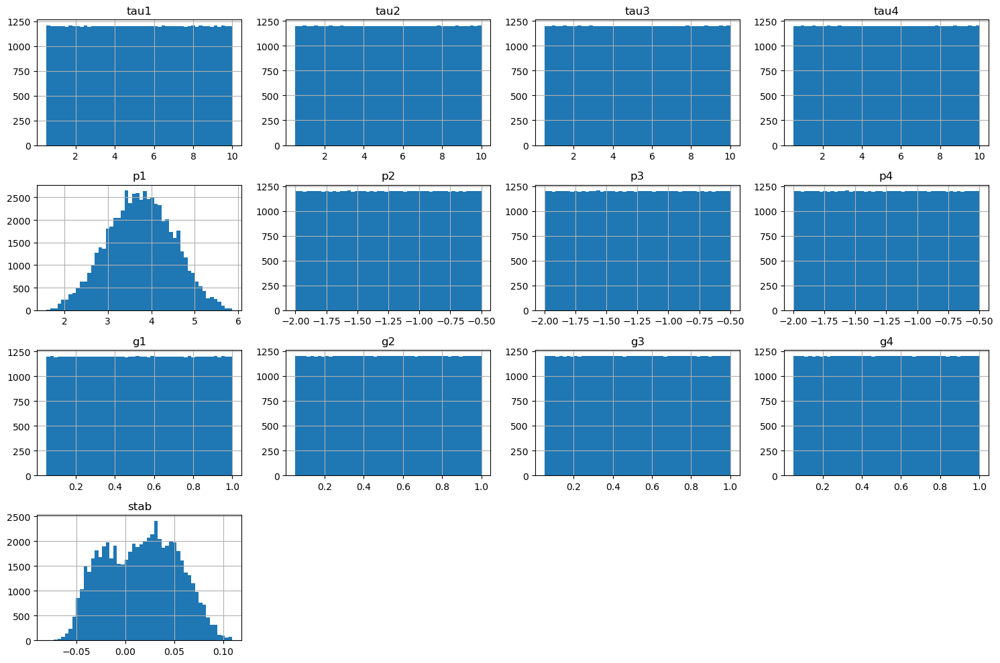

In [6]:
df.hist(bins=50, figsize=(15, 10))
plt.tight_layout()
plt.show()

In [7]:
df["stabf"] = df["stabf"].map({"stable": 1, "unstable": 0})
df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,0
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,1
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,0
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,0
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,0


In [8]:
from sklearn.model_selection import train_test_split

# Separate the features (X) and the target variable (y)
y = df["stabf"]
X = df.drop("stabf", axis=1)

# Split the data into training (80%) and test (20%) sets
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.2, random_state=56
)

# Further split the temporary data into validation (50%) and test (50%) sets
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=156
)

# Optionally, you can drop the temporary variables to free up memory
del X_temp, y_temp

In [9]:
X_train.shape, y_train.shape

((48000, 13), (48000,))

In [10]:
X_test.shape, y_test.shape

((6000, 13), (6000,))

In [11]:
X_val.shape, y_val.shape

((6000, 13), (6000,))

In [12]:
# Apply PCA on the training set only
pca = PCA(n_components=2)
x2d_train = pca.fit_transform(X_train)
x2d_train_df = pd.DataFrame(x2d_train, columns=["PCA Component 1", "PCA Component 2"])

# Transform the test set using the PCA model fitted on the training set
x2d_test = pca.transform(X_test)
x2d_test_df = pd.DataFrame(x2d_test, columns=["PCA Component 1", "PCA Component 2"])

In [13]:
# Make sure the indices are aligned correctly
x2d_train_df.index = y_train.index
x2d_test_df.index = y_test.index

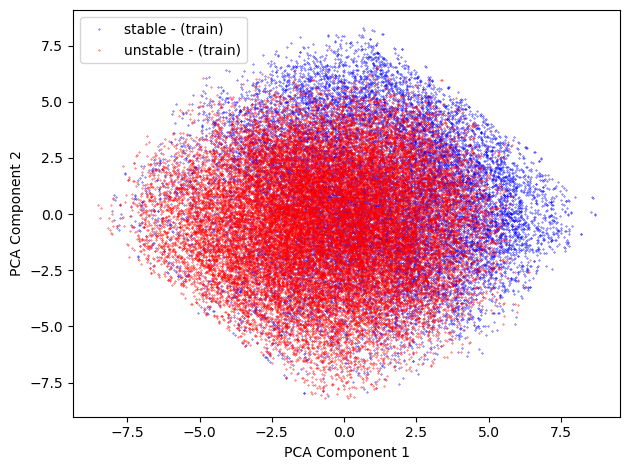

In [14]:
# Plot the training set
plt.plot(
    x2d_train_df["PCA Component 1"][y_train == 1],
    x2d_train_df["PCA Component 2"][y_train == 1],
    "b.",
    ms=0.6,
    label="stable - (train)",
)
plt.plot(
    x2d_train_df["PCA Component 1"][y_train == 0],
    x2d_train_df["PCA Component 2"][y_train == 0],
    "r.",
    ms=0.6,
    label="unstable - (train)",
)

plt.legend(loc="upper left")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.tight_layout()
plt.show()

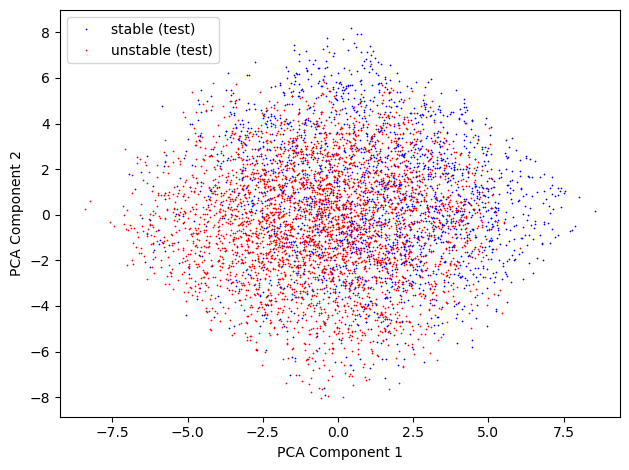

In [15]:
## Plot the test set
plt.plot(
    x2d_test_df.loc[y_test == 1, "PCA Component 1"],
    x2d_test_df.loc[y_test == 1, "PCA Component 2"],
    "bx",
    ms=0.6,
    label="stable (test)",
)
plt.plot(
    x2d_test_df.loc[y_test == 0, "PCA Component 1"],
    x2d_test_df.loc[y_test == 0, "PCA Component 2"],
    "rx",
    ms=0.6,
    label="unstable (test)",
)

plt.legend(loc="upper left")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.tight_layout()
plt.show()

In [16]:
def draw_cm(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    cm = pd.DataFrame(cm, index=["unstable", "stable"], columns=["unstable", "stable"])
    cm_sns = sns.heatmap(cm, cmap="Blues", annot=True)
    cm_sns.set_xlabel("predicted")
    cm_sns.set_ylabel("actual")
    plt.show()

# Regressão Logística

Usando um modelo de regressão logística dentro de um pipeline com escala padrão.

Validação cruzada: Em vez de avaliar a precisão do modelo no conjunto de treinamento, é geralmente melhor usar a validação cruzada para obter uma estimativa mais confiável do desempenho do modelo em dados não vistos.

Busca em grade para ajuste de hiperparâmetros: Realize uma busca em grade com validação cruzada para encontrar os melhores hiperparâmetros para o modelo de regressão logística. Isso pode ser feito usando o GridSearchCV do scikit-learn.

Imprimir a pontuação de precisão no conjunto de teste: Depois de treinar o modelo no conjunto de treinamento e ajustar os hiperparâmetros, avalie o desempenho do modelo no conjunto de teste para obter uma estimativa de sua capacidade de generalização.

In [17]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# Create the pipeline
log_pipe = Pipeline(
    [
        ("std_scl", StandardScaler()),
        ("log_reg", LogisticRegression(max_iter=5000, solver="liblinear")),
    ]
)

# Fit
log_pipe.fit(X_train, y_train)

# Define hyperparameters for grid search
param_grid = {
    "log_reg__C": [0.01, 0.1, 1.0, 10.0],  # Regularization parameter C
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(log_pipe, param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Get the best model from grid search
best_model = grid_search.best_estimator_

# Evaluate the model using cross-validation
cv_scores = cross_val_score(best_model, X_train, y_train, cv=5)
print("Cross-validation scores:", cv_scores)
print("Mean cross-validation accuracy:", cv_scores.mean())
print("Test accuracy:", best_model.score(X_test, y_test))

Cross-validation scores: [0.99958333 0.99958333 0.99979167 0.99885417 0.99947917]
Mean cross-validation accuracy: 0.9994583333333334
Test accuracy: 0.9993333333333333


In [18]:
# Perform cross-validation
cv_scores_accuracy = cross_val_score(log_pipe, X, y, cv=5, scoring="accuracy")
cv_scores_precision = cross_val_score(log_pipe, X, y, cv=5, scoring="precision")
cv_scores_recall = cross_val_score(log_pipe, X, y, cv=5, scoring="recall")
cv_scores_f1 = cross_val_score(log_pipe, X, y, cv=5, scoring="f1")

# Calculate the mean and standard deviation of the scores
mean_accuracy = cv_scores_accuracy.mean()
std_accuracy = cv_scores_accuracy.std()
mean_precision = cv_scores_precision.mean()
std_precision = cv_scores_precision.std()
mean_recall = cv_scores_recall.mean()
std_recall = cv_scores_recall.std()
mean_f1 = cv_scores_f1.mean()
std_f1 = cv_scores_f1.std()

# Print the results
print("Cross-Validation Results:")
print(f"Accuracy: {mean_accuracy:.4f} +/- {std_accuracy:.4f}")
print(f"Precision: {mean_precision:.4f} +/- {std_precision:.4f}")
print(f"Recall: {mean_recall:.4f} +/- {std_recall:.4f}")
print(f"F1 Score: {mean_f1:.4f} +/- {std_f1:.4f}")

# Dictionary to store evaluation metrics
table = {}

# Logistic Regression
log_accuracy = cross_val_score(log_pipe, X, y, cv=5, scoring="accuracy").mean()
log_precision = cross_val_score(log_pipe, X, y, cv=5, scoring="precision").mean()
log_recall = cross_val_score(log_pipe, X, y, cv=5, scoring="recall").mean()
log_f1 = cross_val_score(log_pipe, X, y, cv=5, scoring="f1").mean()

table["Logistic Regression"] = (log_accuracy, log_precision, log_recall, log_f1)

Cross-Validation Results:
Accuracy: 0.9994 +/- 0.0001
Precision: 0.9994 +/- 0.0001
Recall: 0.9990 +/- 0.0002
F1 Score: 0.9992 +/- 0.0001


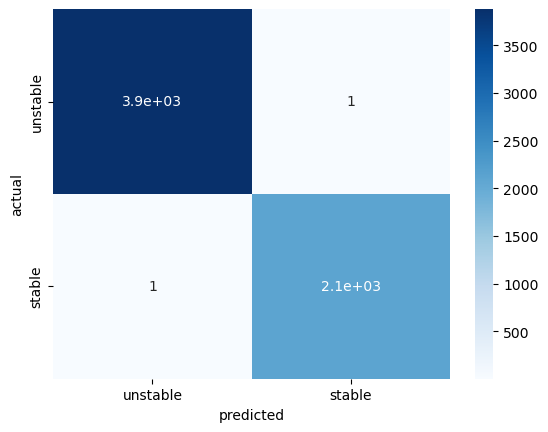

In [19]:
draw_cm(y_val, log_pipe.predict(X_val))

# XGBoost

In [20]:
# Create the XGBoost classifier
xgb_clf = XGBClassifier(n_jobs=-1)

# Fit
xgb_clf.fit(X_train, y_train)

# XGBoost
xgb_accuracy = cross_val_score(xgb_clf, X, y, cv=5, scoring="accuracy").mean()
xgb_precision = cross_val_score(xgb_clf, X, y, cv=5, scoring="precision").mean()
xgb_recall = cross_val_score(xgb_clf, X, y, cv=5, scoring="recall").mean()
xgb_f1 = cross_val_score(xgb_clf, X, y, cv=5, scoring="f1").mean()

table["XGBoost"] = (xgb_accuracy, xgb_precision, xgb_recall, xgb_f1)

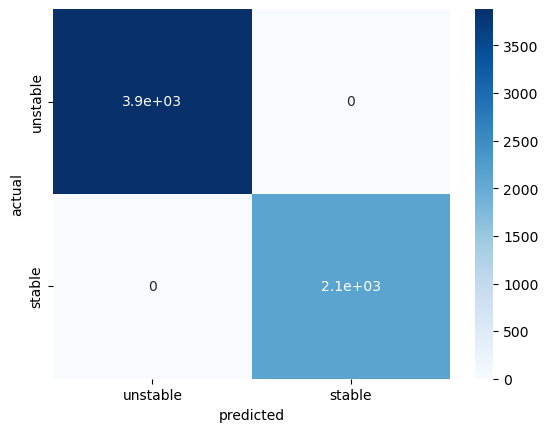

In [21]:
draw_cm(y_val, xgb_clf.predict(X_val))

# Linear SVM

In [22]:
# Create the Linear SVM pipeline
svm_pipe = Pipeline([("std_scl", StandardScaler()), ("svm", LinearSVC(dual=True))])


# Fit
svm_pipe.fit(X_train, y_train)

# Linear SVM
svm_accuracy = cross_val_score(svm_pipe, X, y, cv=5, scoring="accuracy").mean()
svm_precision = cross_val_score(svm_pipe, X, y, cv=5, scoring="precision").mean()
svm_recall = cross_val_score(svm_pipe, X, y, cv=5, scoring="recall").mean()
svm_f1 = cross_val_score(svm_pipe, X, y, cv=5, scoring="f1").mean()

table["Linear SVM"] = (svm_accuracy, svm_precision, svm_recall, svm_f1)

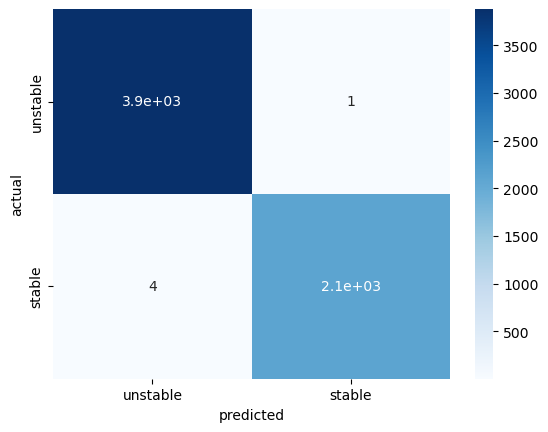

In [23]:
draw_cm(y_val, svm_pipe.predict(X_val))

# SVM with RBF Kernel

Let's use the radial basis function (RBF) kernel with the Support Vector Machine (SVM) classifier.

In [24]:
# Create the SVM pipeline with the RBF kernel
svm_pipe_rbf = Pipeline([("std_scl", StandardScaler()), ("svm", SVC(kernel="rbf"))])

# Fit the SVM model to the training data
svm_pipe_rbf.fit(X_train, y_train)

# Linear SVM
svm_rbf_accuracy = cross_val_score(svm_pipe_rbf, X, y, cv=5, scoring="accuracy").mean()
svm_rbf_precision = cross_val_score(
    svm_pipe_rbf, X, y, cv=5, scoring="precision"
).mean()
svm_rbf_recall = cross_val_score(svm_pipe_rbf, X, y, cv=5, scoring="recall").mean()
svm_rbf_f1 = cross_val_score(svm_pipe_rbf, X, y, cv=5, scoring="f1").mean()

table["Linear SVM RBF"] = (svm_rbf_accuracy, svm_rbf_precision, svm_rbf_recall, svm_f1)

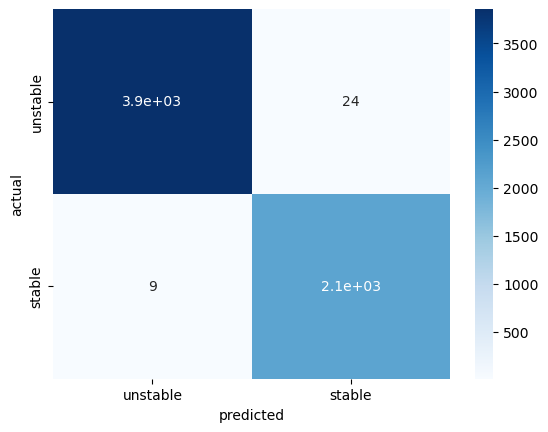

In [26]:
draw_cm(y_val, svm_pipe_rbf.predict(X_val))

# Neural Network

In [27]:
# Define callbacks
check_points = ModelCheckpoint("MinorProject_sgs.keras", save_best_only=True)
early_stopping = EarlyStopping(patience=10, restore_best_weights=True)

In [28]:
# Define the neural network architecture
nn_clf = tf.keras.models.Sequential(
    [
        InputLayer(input_shape=13),
        BatchNormalization(),
        Dense(units=64, activation="relu"),
        Dense(units=256, activation="relu"),
        Dense(units=1, activation="sigmoid"),
    ],
    name="nn_clf",
)

# Display model summary
nn_clf.summary()

Model: "nn_clf"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (Batch  (None, 13)                52        
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 64)                896       
                                                                 
 dense_1 (Dense)             (None, 256)               16640     
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 17845 (69.71 KB)
Trainable params: 17819 (69.61 KB)
Non-trainable params: 26 (104.00 Byte)
_________________________________________________________________


In [29]:
# Compile the model
nn_clf.compile(
    loss="binary_crossentropy",
    optimizer=tf.keras.optimizers.Adam(),
    metrics=["accuracy"],
)

In [31]:
# Train the model
try:
    with tf.device("/GPU:0"):
        history = nn_clf.fit(
            X_train,
            y_train,
            epochs=40,
            validation_data=(X_val, y_val),
            callbacks=[check_points, early_stopping],
            verbose=1,
        )
except RuntimeError as e:
    if "Function was never called" in str(e):
        print("Ignoring unused GPU warning.")
    else:
        raise

Epoch 1/40
1500/1500 [==============================] - 4s 2ms/step - loss: 0.1235 - accuracy: 0.9466 - val_loss: 0.0435 - val_accuracy: 0.9893
Epoch 2/40
  99/1500 [>.............................] - ETA: 2s - loss: 0.1072 - accuracy: 0.9527

/home/luis/anaconda3/envs/py311/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1500/1500 [==============================] - 3s 2ms/step - loss: 0.0985 - accuracy: 0.9581 - val_loss: 0.0454 - val_accuracy: 0.9917
Epoch 3/40
1500/1500 [==============================] - 2s 2ms/step - loss: 0.0928 - accuracy: 0.9601 - val_loss: 0.0452 - val_accuracy: 0.9928
Epoch 4/40
1500/1500 [==============================] - 3s 2ms/step - loss: 0.0952 - accuracy: 0.9589 - val_loss: 0.0391 - val_accuracy: 0.9910
Epoch 5/40
1500/1500 [==============================] - 3s 2ms/step - loss: 0.0901 - accuracy: 0.9603 - val_loss: 0.0422 - val_accuracy: 0.9928
Epoch 6/40
1500/1500 [==============================] - 3s 2ms/step - loss: 0.0886 - accuracy: 0.9630 - val_loss: 0.0373 - val_accuracy: 0.9928
Epoch 7/40
1500/1500 [==============================] - 3s 2ms/step - loss: 0.0882 - accuracy: 0.9619 - val_loss: 0.0440 - val_accuracy: 0.9848
Epoch 8/40
1500/1500 [==============================] - 3s 2ms/step - loss: 0.0861 - accuracy: 0.9629 - val_loss: 0.0380 - val_accuracy: 0.9947
Epo

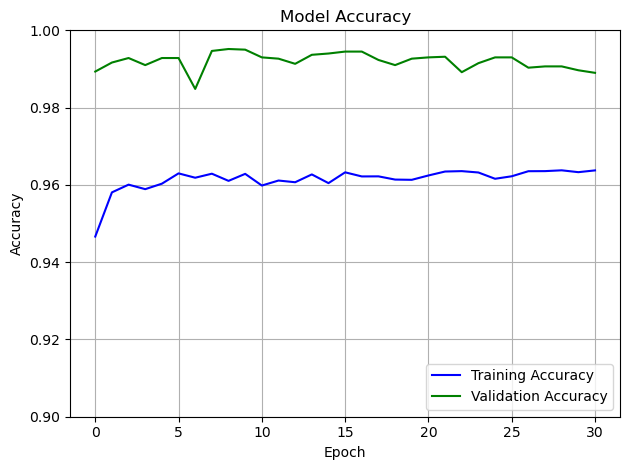

In [32]:
plt.plot(history.history["accuracy"], label="Training Accuracy", color="blue")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy", color="green")
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(loc="lower right")
plt.grid(True)
plt.gca().set_ylim(0.9, 1.0)
plt.tight_layout()
plt.show()

## Predicting smart grid stability

<p style="text-align: justify">After fitting the model to the training set, it is time to extract predictions for the testing set and segregate those above the 'threshold' of 0.5 ('unstable' cases below the threshold, 'stable' cases above it).</p>

In [33]:
accuracy_score(y_test, (nn_clf.predict(X_test) > 0.5))

188/188 [==============================] - 0s 1ms/step


0.9913333333333333

188/188 [==============================] - 0s 1ms/step


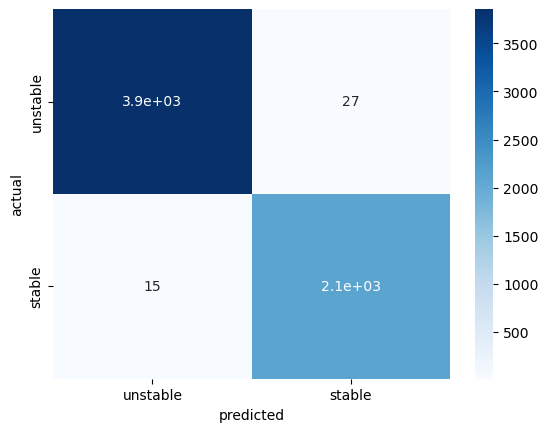

In [34]:
draw_cm(y_val, (nn_clf.predict(X_val) > 0.5))

In [35]:
table["Neural Network"] = (
    accuracy_score(y_test, (nn_clf.predict(X_test) > 0.5)),
    precision_score(y_test, (nn_clf.predict(X_test) > 0.5)),
    recall_score(y_test, (nn_clf.predict(X_test) > 0.5)),
    f1_score(y_test, (nn_clf.predict(X_test) > 0.5)),
)

188/188 [==============================] - 0s 1ms/step


In [37]:
pd.DataFrame(table, index=["accuracy", "precision", "recall", "f1score"])

,Logistic Regression,XGBoost,Linear SVM,Linear SVM RBF,Neural Network
accuracy,0.999400,1.0,0.999450,0.994183,0.991333
precision,0.999355,1.0,0.999677,0.992897,0.987290
recall,0.998987,1.0,0.998803,0.991022,0.989086
f1score,0.999171,1.0,0.999240,0.999240,0.988187


In [39]:
from sklearn.model_selection import KFold

# Define the number of folds for cross-validation
n_folds = 10

# Initialize a list to store the evaluation metrics for each fold
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

# Create a KFold cross-validator
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

# Perform cross-validation
for train_index, val_index in kf.split(X_train):
    x_train_fold, x_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Fit the neural network model for this fold
    nn_clf.fit(x_train_fold, y_train_fold, epochs=40, verbose=0)

    # Calculate the predictions for the validation set of this fold
    nn_predictions_fold = nn_clf.predict(x_val_fold) > 0.5

    # Calculate the evaluation metrics for this fold
    accuracy_fold = accuracy_score(y_val_fold, nn_predictions_fold)
    precision_fold = precision_score(y_val_fold, nn_predictions_fold)
    recall_fold = recall_score(y_val_fold, nn_predictions_fold)
    f1_fold = f1_score(y_val_fold, nn_predictions_fold)

    # Append the evaluation metrics to the lists
    accuracy_scores.append(accuracy_fold)
    precision_scores.append(precision_fold)
    recall_scores.append(recall_fold)
    f1_scores.append(f1_fold)

# Calculate the mean and standard deviation of the evaluation metrics across all folds
mean_accuracy = np.mean(accuracy_scores)
mean_precision = np.mean(precision_scores)
mean_recall = np.mean(recall_scores)
mean_f1 = np.mean(f1_scores)

std_accuracy = np.std(accuracy_scores)
std_precision = np.std(precision_scores)
std_recall = np.std(recall_scores)
std_f1 = np.std(f1_scores)

# Add the mean and standard deviation of the evaluation metrics to the table
table["Neural Network CV Mean"] = (mean_accuracy, mean_precision, mean_recall, mean_f1)
table["Neural Network CV Std"] = (std_accuracy, std_precision, std_recall, std_f1)

150/150 [==============================] - 0s 2ms/step


In [40]:
from sklearn.model_selection import KFold

# Define the number of folds for cross-validation
n_folds = 10

# Initialize a list to store the evaluation metrics for each fold
fold_metrics = []

# Create a KFold cross-validator
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)


# Define a function to perform cross-validation for each fold
def evaluate_fold(fold):
    train_index, val_index = fold
    x_train_fold, x_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Fit the neural network model for this fold
    nn_clf.fit(x_train_fold, y_train_fold, epochs=40, verbose=0)

    # Calculate the predictions for the validation set of this fold
    nn_predictions_fold = nn_clf.predict(x_val_fold) > 0.5

    # Calculate the evaluation metrics for this fold
    accuracy_fold = accuracy_score(y_val_fold, nn_predictions_fold)
    precision_fold = precision_score(y_val_fold, nn_predictions_fold)
    recall_fold = recall_score(y_val_fold, nn_predictions_fold)
    f1_fold = f1_score(y_val_fold, nn_predictions_fold)

    # Return the evaluation metrics for this fold as a tuple
    return (accuracy_fold, precision_fold, recall_fold, f1_fold)


# Use the map function to perform cross-validation and calculate the metrics for each fold
fold_metrics = list(map(evaluate_fold, kf.split(X_train)))

# Calculate the mean and standard deviation of the evaluation metrics across all folds
mean_accuracy = np.mean([metric[0] for metric in fold_metrics])
mean_precision = np.mean([metric[1] for metric in fold_metrics])
mean_recall = np.mean([metric[2] for metric in fold_metrics])
mean_f1 = np.mean([metric[3] for metric in fold_metrics])

std_accuracy = np.std([metric[0] for metric in fold_metrics])
std_precision = np.std([metric[1] for metric in fold_metrics])
std_recall = np.std([metric[2] for metric in fold_metrics])
std_f1 = np.std([metric[3] for metric in fold_metrics])

# Add the mean and standard deviation of the evaluation metrics to the table
table["Neural Network CV Mean"] = (mean_accuracy, mean_precision, mean_recall, mean_f1)
table["Neural Network CV Std"] = (std_accuracy, std_precision, std_recall, std_f1)

150/150 [==============================] - 0s 2ms/step


In [41]:
table["Neural Network CV Mean"]

(0.9965208333333335,
 0.9937110070590339,
 0.9967244626401885,
 0.9952133868077881)

In [42]:
table["Neural Network CV Std"]

(0.0006721777418709258,
 0.002041680389670181,
 0.0012561664122547073,
 0.0009076386317268353)